# Compare Levmar vs GSL engines (sinh, only sim09_r.fits)

In [1]:
%matplotlib notebook
from astropy.io import fits
from astropy.table import Table
import matplotlib.pyplot as plt
import prettyprint
import re
import numpy as np
from glob import glob
from matplotlib import colors
from matplotlib.patches import Ellipse
from matplotlib.collections import PatchCollection
from matplotlib.gridspec import GridSpec
from stuff import Simulation
from validation import CrossValidation
from image import Image

## Model configuration

In [2]:
prettyprint.prettyprint('/home/aalvarez/Work/Data/sim09/sim09.config')

In [3]:
prettyprint.prettyprint('/home/aalvarez/Work/Data/sim09/sim09_r_model.py')

In [4]:
base_dir = '/home/aalvarez/Work/Data/sim09/'
frames = sorted(glob(os.path.join(base_dir, 'sim09_r_*.fits')))
nframes = len(frames)
print(f'Number of frames used: {nframes}')

Number of frames used: 10


## Levmar run

In [5]:
levmar_dir = '/home/aalvarez/Work/Data/sim09/sim09_r_levmar/'
levmar_log = open(os.path.join(levmar_dir, 'sim09.log')).read()

In [6]:
rengine = re.search('Using engine \w+', levmar_log)
levmar_log[rengine.start():rengine.end()]

'Using engine levmar'

In [7]:
re.findall('Elapsed: \d+:\d+:\d+', levmar_log)[-1]

'Elapsed: 00:03:24'

In [8]:
cmap = plt.get_cmap('Greys')
norm = colors.SymLogNorm(1)

ncols = 2
nrows = int(nframes / ncols)

<IPython.core.display.Javascript object>


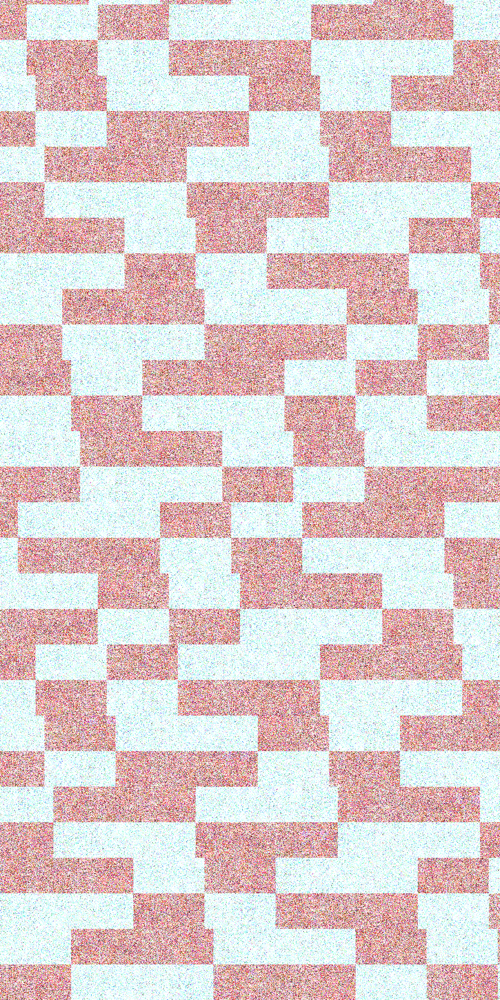

In [9]:
fig, axs = plt.subplots(nrows, ncols, figsize=(9,18))

for i in range(nframes):
    frame_data = fits.open(os.path.join(levmar_dir, f'_residual_{i}.fits'))[0].data
    axs[int(i / 2), int(i % 2)].imshow(frame_data, cmap=cmap, norm=norm)

plt.tight_layout()
plt.show()

## Ceres run

In [10]:
ceres_dir = '/home/aalvarez/Work/Data/sim09/sim09_r_ceres/'
ceres_log = open(os.path.join(ceres_dir, 'sim09.log')).read()

In [11]:
rengine = re.search('Using engine \w+', ceres_log)
ceres_log[rengine.start():rengine.end()]

'Using engine ceres'

In [12]:
re.findall('Elapsed: \d+:\d+:\d+', ceres_log)[-1]

'Elapsed: 00:05:42'

First approach takes longer. May be possible to play with the parameters?

<IPython.core.display.Javascript object>


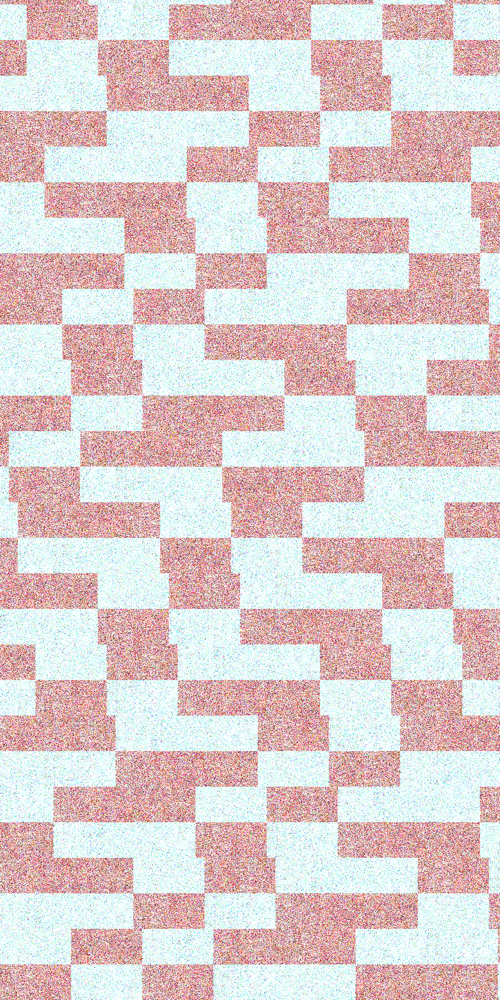

In [13]:
fig, axs = plt.subplots(nrows, ncols, figsize=(9,18))

for i in range(nframes):
    frame_data = fits.open(os.path.join(ceres_dir, f'_residual_{i}.fits'))[0].data
    axs[int(i / 2), int(i % 2)].imshow(frame_data, cmap=cmap, norm=norm)

plt.tight_layout()
plt.show()

## Compare

<IPython.core.display.Javascript object>


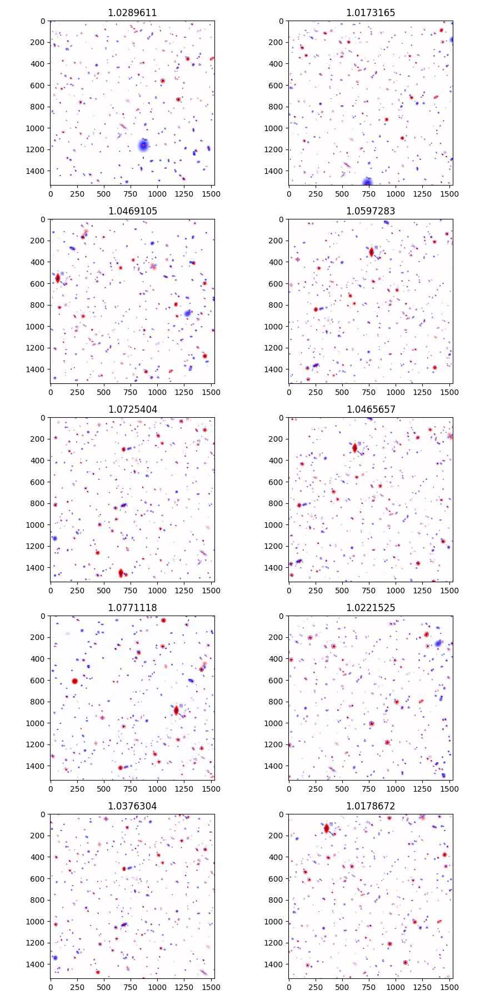

In [32]:
fig, axs = plt.subplots(nrows, ncols, figsize=(9,18))
diff_norm = colors.SymLogNorm(1, vmin=-1e5, vmax=1e5)
levmar_total_residual = 0
ceres_total_residual = 0

for i in range(nframes):
    levmar_residual = fits.open(os.path.join(levmar_dir, f'_residual_{i}.fits'))[0].data
    ceres_residual = fits.open(os.path.join(ceres_dir, f'_residual_{i}.fits'))[0].data
    levmar_total_residual += np.abs(levmar_residual).sum()
    ceres_total_residual += np.abs(ceres_residual).sum()
    ratio = np.abs(ceres_residual).sum() / np.abs(levmar_residual).sum()
    axs[int(i/2), int(i%2)].imshow(levmar_residual-ceres_residual, cmap=plt.get_cmap('seismic'), norm=diff_norm)
    axs[int(i/2), int(i%2)].set_title(ratio)

plt.tight_layout()
plt.show()

In [31]:
print(ceres_total_residual/levmar_total_residual)

1.0438128319141302


## Compare catalogs

In [16]:
levmar_cat = Table.read(os.path.join(levmar_dir, 'sim09_cat.fits'))
ceres_cat = Table.read(os.path.join(ceres_dir, 'sim09_cat.fits'))
sim09_r = Simulation('/home/aalvarez/Work/Data/sim09/sim09_r.list', mag_zeropoint=26, exposure=300)
sim09_r_img = Image('/home/aalvarez/Work/Data/sim09/sim09_r.fits', weight_image='/home/aalvarez/Work/Data/sim09/sim09_r.weight.fits')

In [17]:
print((np.isnan(levmar_cat['fmf_reduced_chi_2']) == np.isnan(ceres_cat['fmf_reduced_chi_2'])).all())
print(np.isclose(levmar_cat['auto_flux'], ceres_cat['auto_flux']).all())
print(np.isclose(levmar_cat['auto_flux_err'], ceres_cat['auto_flux_err']).all())

True
True
True


Filter out entries that have NaN $\chi^2$ or with a low signal/noise ratio (using iso aperture, which is the same for both)

In [18]:
nan_chi2 = np.isnan(levmar_cat['fmf_reduced_chi_2']) == False
signal_f = levmar_cat['isophotal_flux'] / levmar_cat['isophotal_flux_err'] > 10.
matching = np.logical_and(nan_chi2, signal_f)
levmar_cat = levmar_cat[matching]
ceres_cat = ceres_cat[matching]

print(len(ceres_cat))

844


In [19]:
crossval_r = CrossValidation(sim09_r_img, sim09_r, max_dist=1.5)

In [20]:
ceres_cross_r = crossval_r(ceres_cat['x'], ceres_cat['y'])
levmar_cross_r = crossval_r(levmar_cat['x'], levmar_cat['y'])

<IPython.core.display.Javascript object>


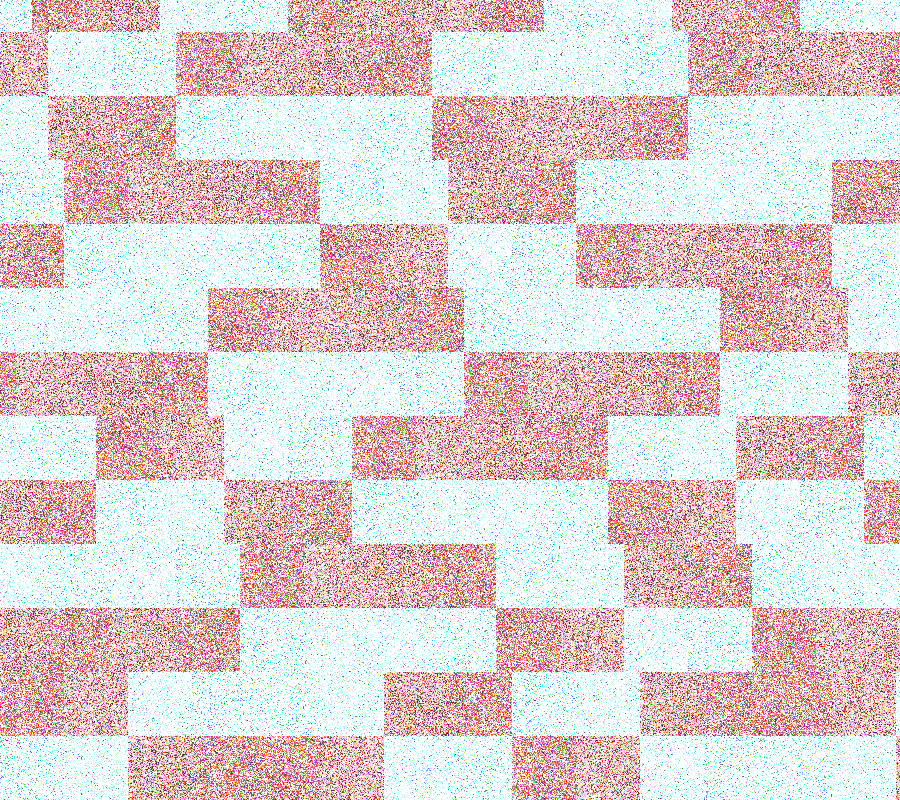

In [21]:
fig = plt.figure(figsize=(9, 8))
fig.subplots_adjust(left=0.07, right=0.93, hspace=0.0, wspace=0.2)
gridspec = GridSpec(3, 1)

ax_mag = fig.add_subplot(gridspec.new_subplotspec((0, 0), 2))
ax_mag.set_title('R Band')
ax_mag.set_ylabel('Modeled magnitude')
ax_mag.set_xlabel('Real magnitude')
ax_mag.scatter(levmar_cross_r.all_magnitudes, levmar_cat[levmar_cross_r.all_catalog]['mag'], label='Levmar', marker='o')
ax_mag.scatter(ceres_cross_r.all_magnitudes, ceres_cat[ceres_cross_r.all_catalog]['mag'], label='Ceres', marker='.')
ax_mag.grid(True)
ax_mag.legend()

ax_diff = fig.add_subplot(gridspec.new_subplotspec((2, 0), 1))
ax_diff.set_ylabel('$\Delta$')
ax_diff.set_xlabel('Real magnitude')
ax_diff.scatter(levmar_cross_r.all_magnitudes, levmar_cat[levmar_cross_r.all_catalog]['mag'] - levmar_cross_r.all_magnitudes, label='Levmar', marker='o')
ax_diff.scatter(ceres_cross_r.all_magnitudes, ceres_cat[ceres_cross_r.all_catalog]['mag'] - ceres_cross_r.all_magnitudes, label='GSL', marker='.')
ax_diff.set_ylim(1, -1)
ax_diff.grid(True)

plt.show()

<IPython.core.display.Javascript object>


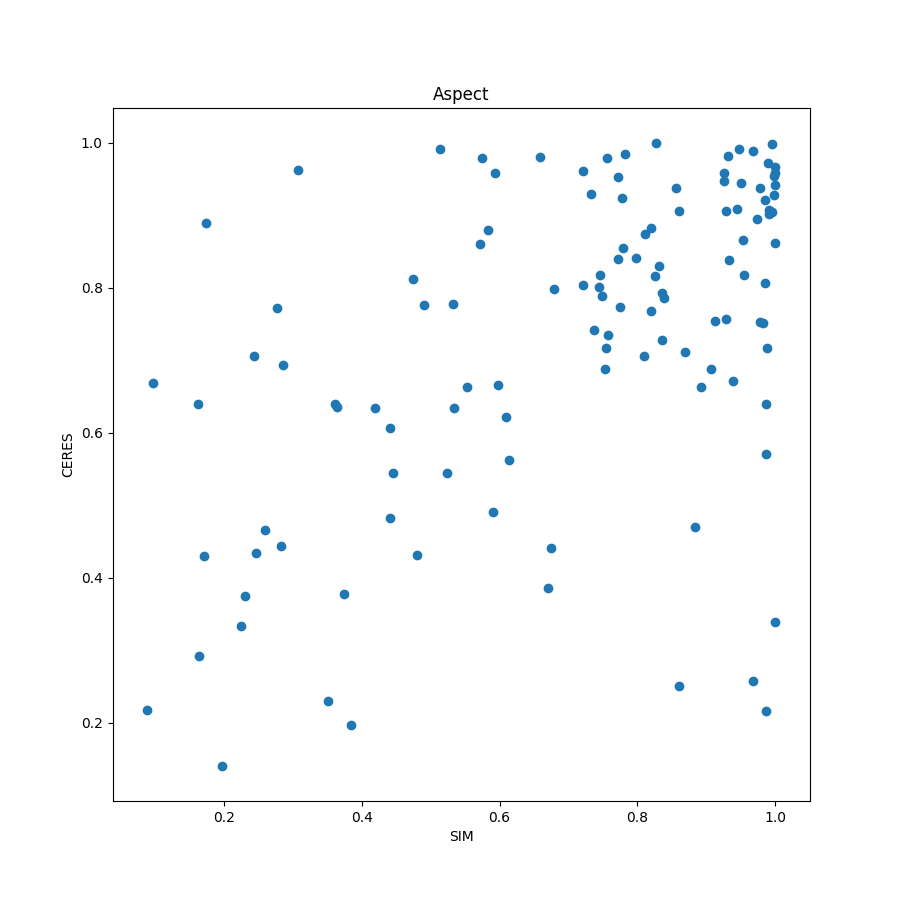

Text(0.5, 1.0, 'Aspect')

In [44]:
plt.figure(figsize=(9,9))
aspect_norm = levmar_cat[levmar_cross_r.galaxies_catalog]['aspect']
aspect_norm[aspect_norm>1.] = 1./aspect_norm[aspect_norm>1.]
plt.scatter(levmar_cross_r.galaxies_found.disk_aspect, aspect_norm)
plt.xlabel('SIM')
plt.ylabel('CERES')
plt.title('Aspect')

<IPython.core.display.Javascript object>


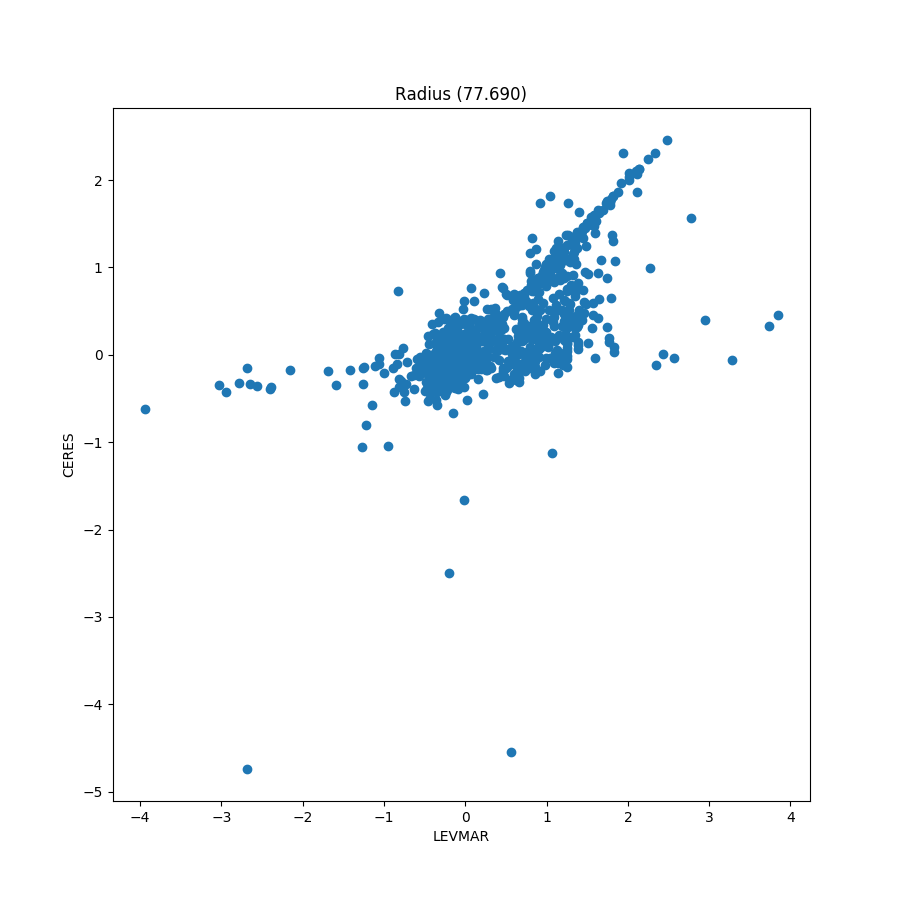

Text(0, 0.5, 'CERES')

In [23]:
plt.figure(figsize=(9,9))
plt.scatter(np.log(levmar_cat['rad']), np.log(ceres_cat['rad']))
plt.title(
    'Radius ({:.3f})'.format(np.sqrt(((levmar_cat['rad'] - ceres_cat['rad'])**2).sum()))
)
plt.xlabel('LEVMAR')
plt.ylabel('CERES')

<IPython.core.display.Javascript object>


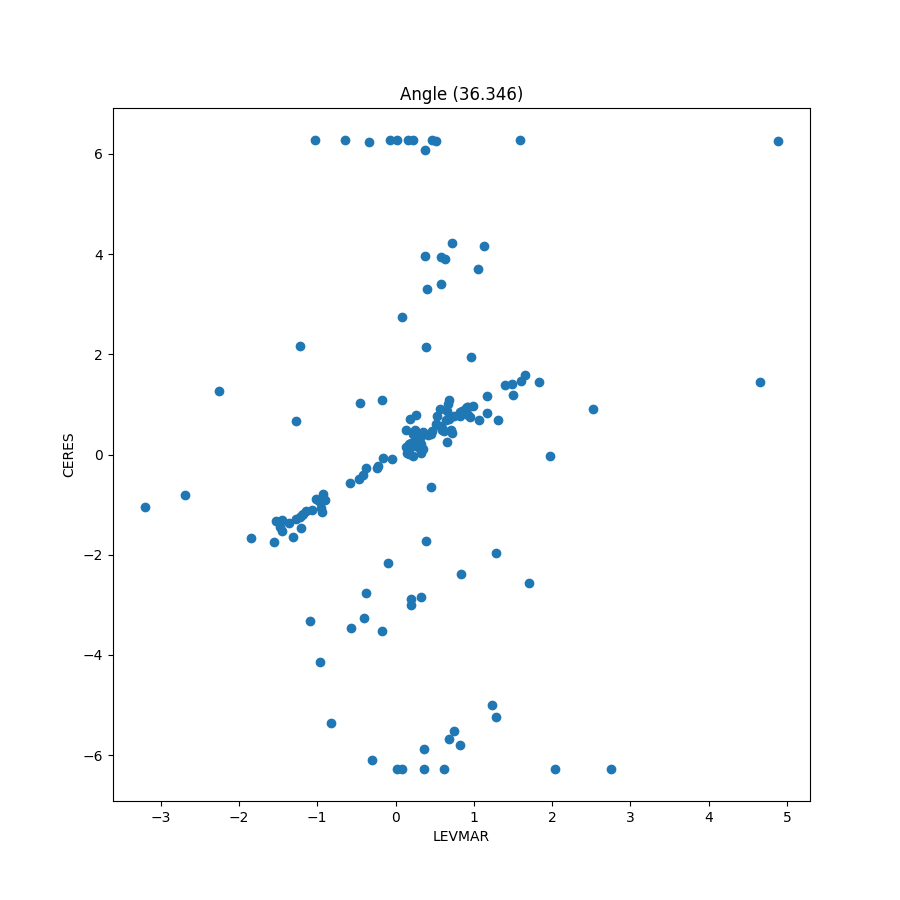

Text(0, 0.5, 'CERES')

In [24]:
f = np.logical_or(
    np.logical_and(levmar_cat['aspect'] < 0.9, ceres_cat['aspect'] < 0.9),
    np.logical_and(levmar_cat['aspect'] > 1.1, ceres_cat['aspect'] > 1.1)
)
plt.figure(figsize=(9,9))
plt.scatter(levmar_cat['angle'][f], ceres_cat['angle'][f])
plt.title(
    'Angle ({:.3f})'.format(np.sqrt(((levmar_cat['angle'][f] - ceres_cat['angle'][f])**2).sum()))
)
plt.xlabel('LEVMAR')
plt.ylabel('CERES')

In [25]:
sim09_img = fits.open('/home/aalvarez/Work/Data/sim09/sim09_r.fits')[0].data

In [26]:
def render_models(fig, ax, catalog, **kwargs):
    patches = []
    for entry in catalog:
        patches.append(Ellipse((entry['x', 'y']), entry['rad']*2, entry['rad']*2*entry['aspect'], angle=np.degrees(-entry['angle']), **kwargs))
    col = PatchCollection(patches, alpha=0.5)
    col.set(array=np.log(catalog['flux']), cmap='inferno')
    ax.add_collection(col)
    ax.scatter(catalog['pixel_centroid_x'], levmar_cat['pixel_centroid_y'], marker='1', label='Detected', c='r')
    fig.colorbar(col, ax=ax)

<IPython.core.display.Javascript object>


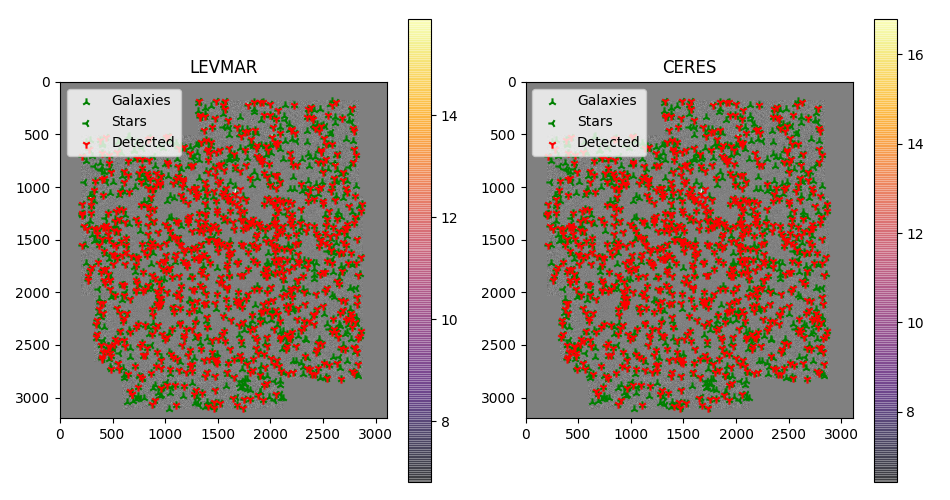

In [27]:
fig = plt.figure(figsize=(9.5, 5))
ax_levmar = plt.subplot(121)

ax_levmar.imshow(sim09_img, cmap=plt.get_cmap('Greys_r'), norm=colors.SymLogNorm(100))
ax_levmar.scatter(crossval_r.galaxies['x'], crossval_r.galaxies['y'], marker='2', label='Galaxies', c='green')
ax_levmar.scatter(crossval_r.stars['x'], crossval_r.stars['y'], marker='3', label='Stars', c='green')
render_models(fig, ax_levmar, levmar_cat)
ax_levmar.legend()
ax_levmar.set_title('LEVMAR')

ax_gsl = plt.subplot(122, sharex=ax_levmar, sharey=ax_levmar)
ax_gsl.imshow(sim09_img, cmap=plt.get_cmap('Greys_r'), norm=colors.SymLogNorm(100))
ax_gsl.scatter(crossval_r.galaxies['x'], crossval_r.galaxies['y'], marker='2', label='Galaxies', c='green')
ax_gsl.scatter(crossval_r.stars['x'], crossval_r.stars['y'], marker='3', label='Stars', c='green')
render_models(fig, ax_gsl, ceres_cat)
ax_gsl.legend()
ax_gsl.set_title('CERES')

plt.tight_layout()